## Projektarbeit: How to avoid dying from eating poisonous mushrooms

In [1]:
import pandas as pd
import numpy as np
from sklearn import tree, metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, accuracy_score, confusion_matrix, precision_recall_fscore_support, roc_auc_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
from ucimlrepo import fetch_ucirepo
import math
import tqdm
from mpl_toolkits.mplot3d import Axes3D
import shap

ModuleNotFoundError: No module named 'xgboost'

In [2]:
# fetch dataset
m_shroom = fetch_ucirepo(id=73)

# data (as pandas dataframes)
x = m_shroom.data.features
y = m_shroom.data.targets

mushroom = pd.concat([x, y], axis=1)

# metadata
print(m_shroom.metadata)

# variable information
print(m_shroom.variables)

{'uci_id': 73, 'name': 'Mushroom', 'repository_url': 'https://archive.ics.uci.edu/dataset/73/mushroom', 'data_url': 'https://archive.ics.uci.edu/static/public/73/data.csv', 'abstract': 'From Audobon Society Field Guide; mushrooms described in terms of physical characteristics; classification: poisonous or edible', 'area': 'Biology', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 8124, 'num_features': 22, 'feature_types': ['Categorical'], 'demographics': [], 'target_col': ['poisonous'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1981, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5959T', 'creators': [], 'intro_paper': None, 'additional_info': {'summary': "This data set includes descriptions of hypothetical samples corresponding to 23 species of gilled mushrooms in the Agaricus and Lepiota Family (pp. 500-525).  Each species is identified as definitely edible, definitely po

In [3]:
x.head ()

,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,x,s,n,t,p,f,c,n,k,e,...,s,w,w,p,w,o,p,k,s,u
1,x,s,y,t,a,f,c,b,k,e,...,s,w,w,p,w,o,p,n,n,g
2,b,s,w,t,l,f,c,b,n,e,...,s,w,w,p,w,o,p,n,n,m
3,x,y,w,t,p,f,c,n,n,e,...,s,w,w,p,w,o,p,k,s,u
4,x,s,g,f,n,f,w,b,k,t,...,s,w,w,p,w,o,e,n,a,g


In [4]:
y.head ()

,poisonous
0,p
1,e
2,e
3,p
4,e


In [5]:
# Split data for testing and training
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=None)

print('Train set shape: {}'.format(x_train.shape))
print('Test set shape: {}'.format(x_test.shape))

Train set shape: (5443, 22)
Test set shape: (2681, 22)


In [6]:
# Imputing missing values with pandas dataframe
si = SimpleImputer(strategy='most_frequent')
x_train = si.fit_transform(x_train)
x_test = si.transform(x_test)

x_train = pd.DataFrame(x_train,columns=m_shroom.data.features.columns)
x_test = pd.DataFrame(x_test,columns=m_shroom.data.features.columns)

In [7]:
# no missing target-values

In [8]:
# Rename the column to "target"
y_train.rename(columns={"poisonous": "target"}, inplace=True)
y_test.rename(columns={"poisonous": "target"}, inplace=True)

# Encoding of the target
y_train['target'] = y_train['target'].map({'p': 1, 'e': 0})
y_test['target'] = y_test['target'].map({'p': 1, 'e': 0})

In [9]:
# Encoding of x-values
encoder = OneHotEncoder(drop="first")
encoder.fit(x_train)
x_encoded = encoder.transform(x_train)
x_train = pd.DataFrame(x_encoded.todense(),columns=encoder.get_feature_names_out())

encoder.fit(x_test)
x_encoded2 = encoder.transform(x_test)
x_test = pd.DataFrame(x_encoded2.todense(),columns=encoder.get_feature_names_out())

In [10]:
# Normalizing x- and y-values: not necessary

In [11]:
# Multicollinearity

# Reset indices of x_train and y_train
x_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

# Concatenate x_train and y_train into mushroom_train DataFrame
mushroom_train = pd.concat([x_train, y_train], axis=1)

corr_matrix = mushroom_train.corr().abs()
corr_matrix

,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_g,cap-surface_s,cap-surface_y,cap-color_c,cap-color_e,...,population_s,population_v,population_y,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w,target
cap-shape_c,1.000000,0.018779,0.007849,0.001496,0.021207,0.577244,0.016091,0.013030,0.001627,0.011209,...,0.010032,0.023583,0.012215,0.014038,0.069902,0.004417,0.009683,0.005120,0.003673,0.024082
cap-shape_f,0.018779,1.000000,0.267288,0.050942,0.722154,0.010840,0.091511,0.022826,0.006234,0.009745,...,0.072605,0.036171,0.101155,0.008493,0.057775,0.127609,0.014403,0.019291,0.019009,0.011468
cap-shape_k,0.007849,0.267288,1.000000,0.021293,0.301854,0.004531,0.156261,0.000334,0.030018,0.170545,...,0.090353,0.173964,0.172363,0.117951,0.243970,0.062872,0.096243,0.072876,0.131810,0.161841
cap-shape_s,0.001496,0.050942,0.021293,1.000000,0.057530,0.000864,0.043650,0.051514,0.004413,0.030408,...,0.027214,0.005522,0.037598,0.038082,0.021401,0.011983,0.026269,0.292185,0.009965,0.062121
cap-shape_x,0.021207,0.722154,0.301854,0.057530,1.000000,0.012242,0.052408,0.006557,0.003639,0.054814,...,0.050784,0.062544,0.056278,0.016182,0.092938,0.015353,0.024438,0.012506,0.042082,0.017535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
habitat_m,0.004417,0.127609,0.062872,0.011983,0.015353,0.002550,0.074986,0.038184,0.013032,0.089784,...,0.154789,0.142376,0.097837,0.112445,0.063191,1.000000,0.077563,0.041011,0.029423,0.136889
habitat_p,0.009683,0.014403,0.096243,0.026269,0.024438,0.005590,0.028754,0.117563,0.024357,0.076734,...,0.122761,0.172896,0.028740,0.246501,0.138528,0.077563,1.000000,0.089905,0.064502,0.318571
habitat_u,0.005120,0.019291,0.072876,0.292185,0.012506,0.002956,0.111853,0.102287,0.015105,0.104070,...,0.119437,0.008789,0.046562,0.130336,0.073246,0.041011,0.089905,1.000000,0.034105,0.103501
habitat_w,0.003673,0.019009,0.131810,0.009965,0.042082,0.002120,0.073458,0.021169,0.010837,0.033667,...,0.066822,0.157086,0.081361,0.093509,0.052550,0.029423,0.064502,0.034105,1.000000,0.152535


In [12]:
# Filter out correlations where both features are the same (correlation equals 1)
mask = np.eye(len(corr_matrix), dtype=bool)
filtered_corr = corr_matrix.mask(mask)

# Find correlations greater than or equal to 0.5
high_corr = filtered_corr[filtered_corr >= 0.5].stack().reset_index()

high_corr.head (20)

,level_0,level_1,0
0,cap-shape_c,cap-surface_g,0.577244
1,cap-shape_f,cap-shape_x,0.722154
2,cap-shape_x,cap-shape_f,0.722154
3,cap-surface_g,cap-shape_c,0.577244
4,cap-surface_s,cap-surface_y,0.554079
5,cap-surface_y,cap-surface_s,0.554079
6,cap-color_r,ring-type_f,0.591438
7,cap-color_u,ring-type_f,0.543943
8,bruises_t,stalk-surface-above-ring_k,0.544759
9,bruises_t,stalk-surface-above-ring_s,0.560428


## Machine Learning Models

### KNeirestNeighbors

In [13]:
# Building a Model: KNeirestneighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train, y_train)

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/neighbors/_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=9)

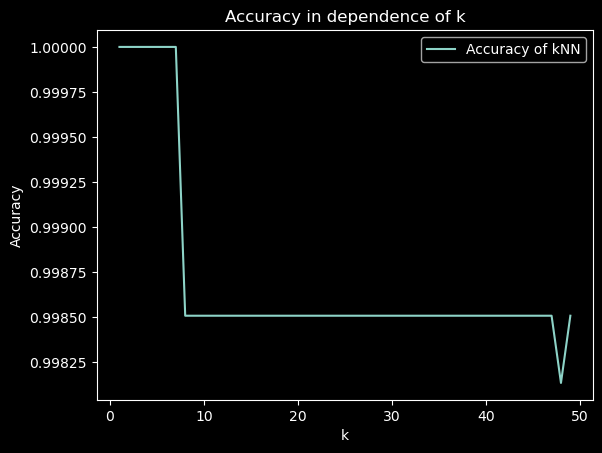

In [14]:
# Ensure x_train and y_train are NumPy arrays
x_train = x_train.values if isinstance(x_train, pd.DataFrame) else x_train
x_test = x_test.values if isinstance(x_test, pd.DataFrame) else x_test
y_train = y_train.values if isinstance(y_train, pd.DataFrame) else y_train
y_test = y_test.values if isinstance(y_test, pd.DataFrame) else y_test

# Ensure y_train is a 1D array
if y_train.ndim > 1:
    y_train = y_train.squeeze()

# Finding the best k
scores = []
for i in range(1, 50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train, y_train)
    scores.append(knn.score(x_test, y_test))

plt.title("Accuracy in dependence of k")
plt.plot(range(1, 50), scores, label="Accuracy of kNN")
plt.xlabel("k")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

<class 'numpy.ndarray'>
(5443, 94)
<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
True
<class 'numpy.ndarray'>
(1, 94)


  0%|          | 0/5443 [00:00<?, ?it/s]

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_

Background samples shape: (1, 94)
SHAP values shape: (5443, 94)


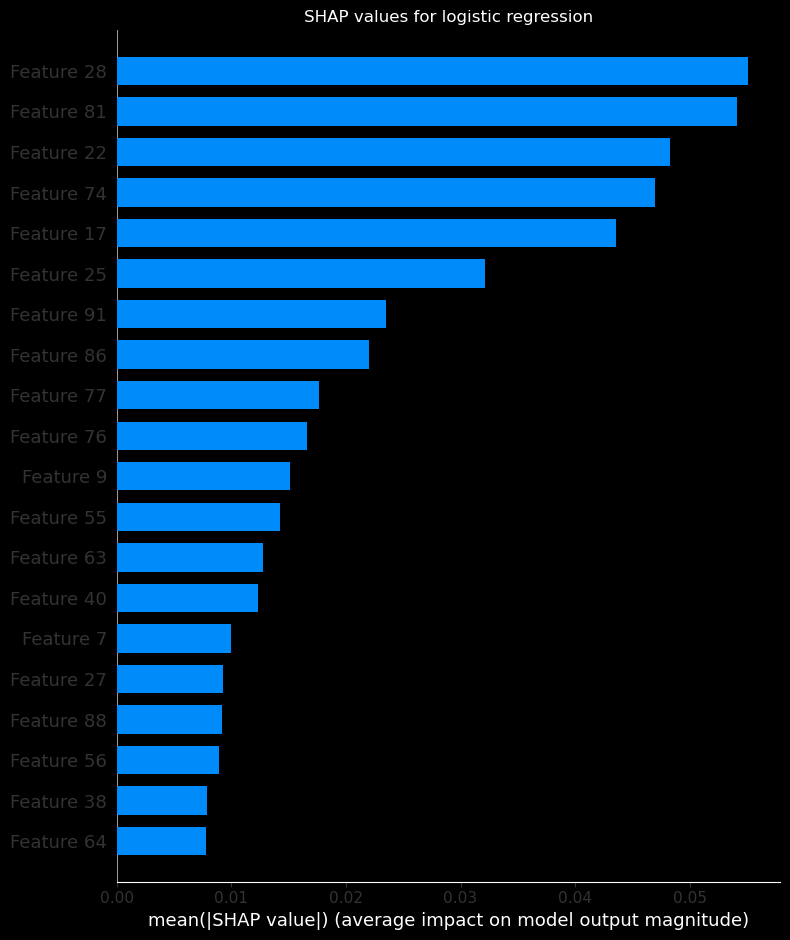

In [15]:
print(type(x_train))
print(x_train.shape)

print(type(knn))
print(hasattr(knn, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_knn = shap.KernelExplainer(knn.predict, background_samples)
shap_values_knn = explainer_knn.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_knn).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for kNN")
shap.summary_plot(shap_values_knn, x_train, plot_type="bar")
plt.show()

In [16]:
# calculate accuracy, precision and recall for knn

predict_knn = knn.predict(x_test)

cm = confusion_matrix(predict_knn, y_test)
_, fp, fn, tp = cm.ravel()

print("accuracy for knn: {}".format(accuracy_score(predict_knn, y_test)))
print("precision for knn: {}".format(tp/(tp + fp)))
print("recall for knn: {}".format(tp/(tp + fn)))

accuracy for knn: 0.9985080193957478
precision for knn: 0.9968329374505146
recall for knn: 1.0


AttributeError: 'numpy.ndarray' object has no attribute 'values'

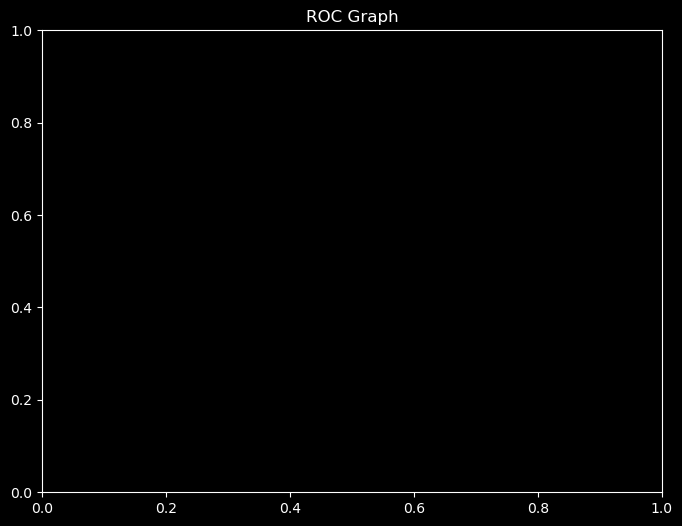

In [18]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, knn.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph kNN",c="purple")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### Decision Tree

In [ ]:
# Building a Model: Decision Tree
dtc = DecisionTreeClassifier(max_depth=4, min_samples_split=50, class_weight = "balanced", random_state=1)
dtc.fit(x_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=4,
                       min_samples_split=50, random_state=1)

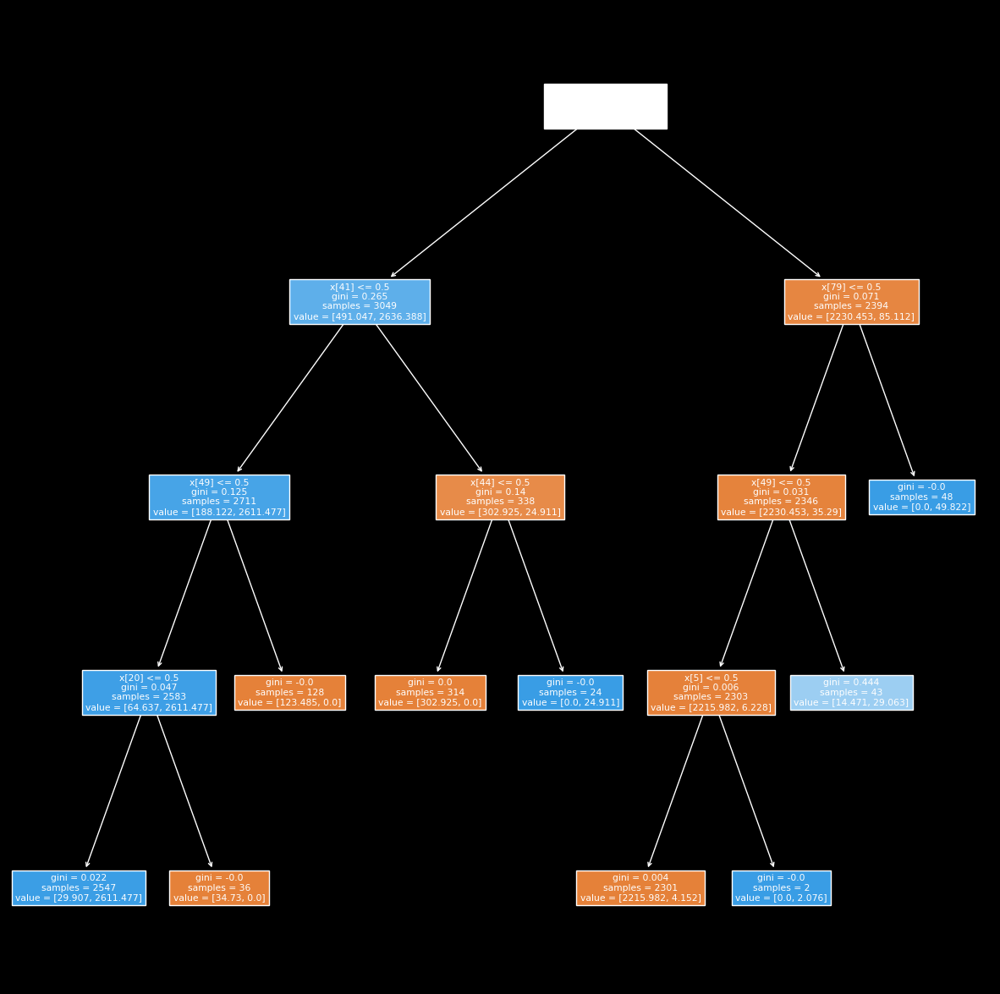

In [ ]:
fig = plt.figure(figsize=(15,15))
baum = tree.plot_tree(dtc, filled=True)

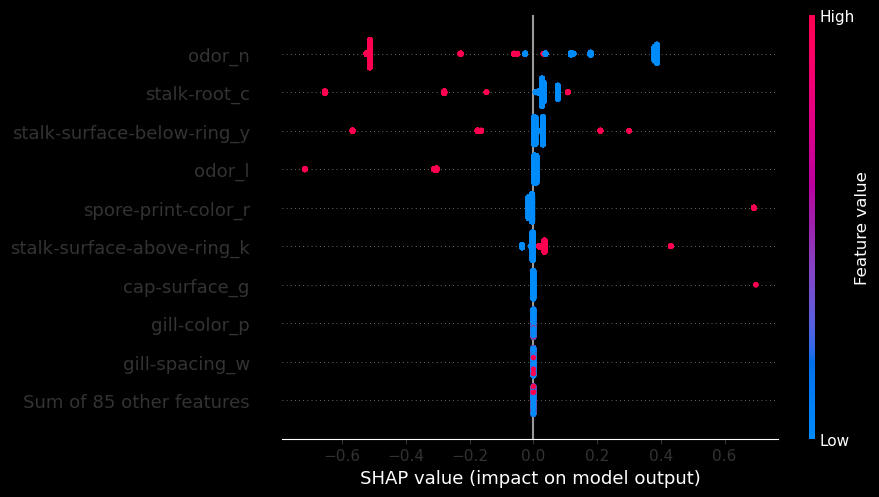

In [ ]:
# calculate feature importance with SHAP
from shap import Explainer
from shap.plots import beeswarm

explainer_short_dtc = Explainer(dtc)
sv_dtc = explainer_short_dtc(x_train)

beeswarm(sv_dtc[:,:,1])

<class 'pandas.core.frame.DataFrame'>
(5443, 94)
<class 'sklearn.tree._classes.DecisionTreeClassifier'>
True
<class 'pandas.core.frame.DataFrame'>
(1, 94)


  0%|          | 0/5443 [00:00<?, ?it/s]

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_

Background samples shape: (1, 94)
SHAP values shape: (5443, 94)


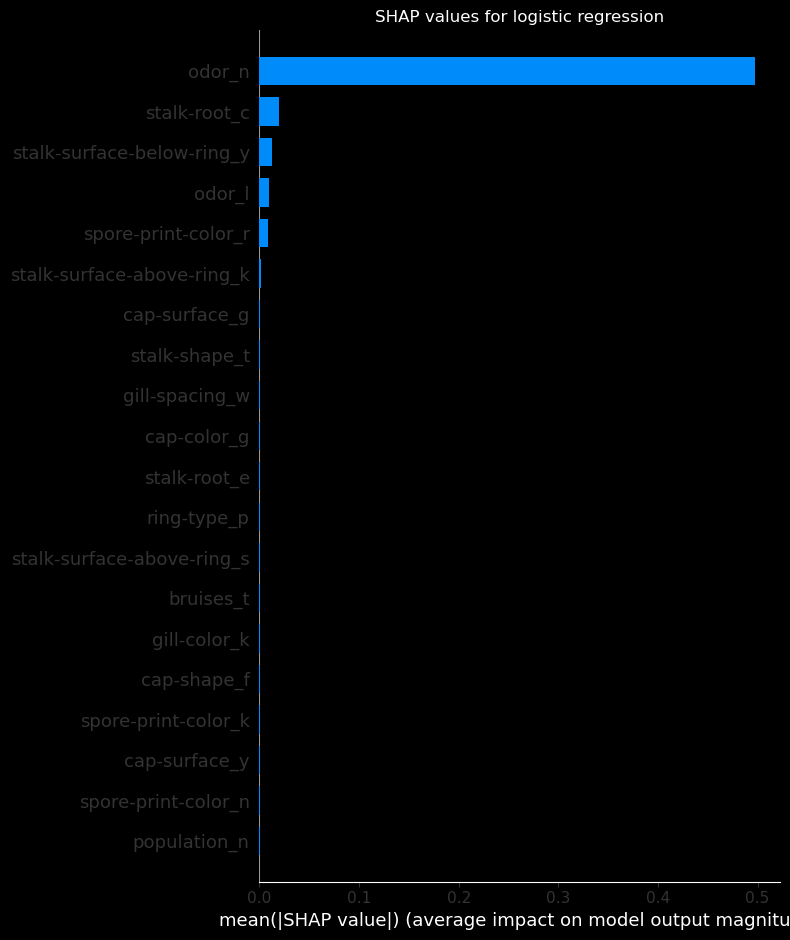

In [ ]:
print(type(x_train))
print(x_train.shape)

print(type(dtc))
print(hasattr(dtc, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_dtc = shap.KernelExplainer(dtc.predict, background_samples)
shap_values_dtc = explainer_dtc.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_dtc).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for logistic regression")
shap.summary_plot(shap_values_dtc, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for dtc

predict_dtc = dtc.predict(x_test)

cm = confusion_matrix(predict_dtc, y_test)
_, fp, fn, tp = cm.ravel()

print("accuracy for Decision Tree: {}".format(accuracy_score(predict_dtc, y_test)))
print("precision for Decision Tree: {}".format(tp/(tp + fp)))
print("recall for Decision Tree: {}".format(tp/(tp + fn)))

accuracy: 0.9932860872808653
precision: 1.0
recall: 0.9862804878048781


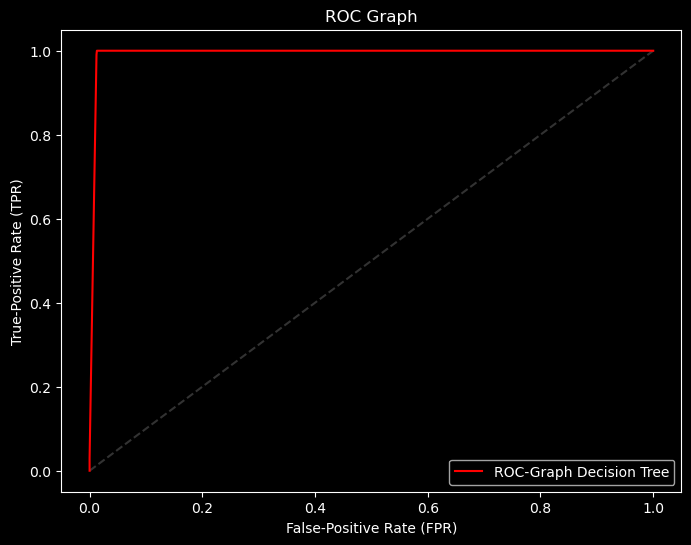

In [ ]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, dtc.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph Decision Tree",c="red")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### Logistic Regression

In [ ]:
# Building a model: Logistic Regression
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

<class 'pandas.core.frame.DataFrame'>
(5443, 94)
<class 'sklearn.linear_model._logistic.LogisticRegression'>
True
<class 'pandas.core.frame.DataFrame'>
(1, 94)


  0%|          | 0/5443 [00:00<?, ?it/s]

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_

Background samples shape: (1, 94)
SHAP values shape: (5443, 94)


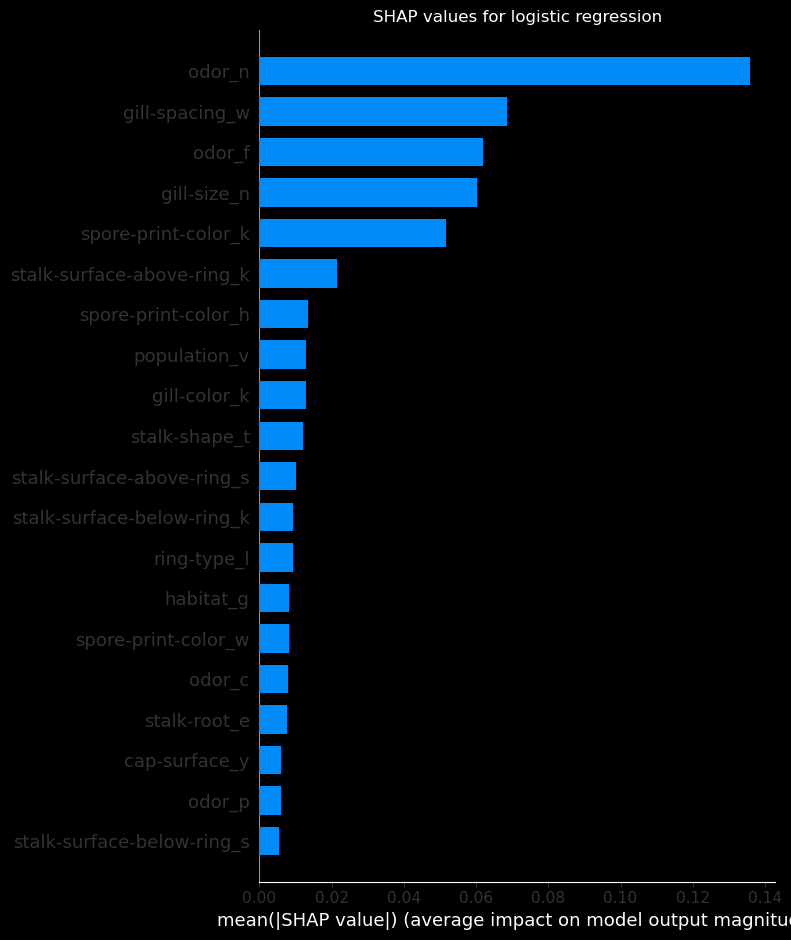

In [ ]:
# Analyzing SHAP-value
print(type(x_train))
print(x_train.shape)

print(type(logreg))
print(hasattr(logreg, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_logreg = shap.KernelExplainer(logreg.predict, background_samples)
shap_values_logreg = explainer_logreg.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_logreg).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for logistic regression")
shap.summary_plot(shap_values_logreg, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for logistic regression

#enlarge number of background samples
#background_samples = shap.sample(x_train, 5443)
#print(type(background_samples))
#print(background_samples.shape)

predict_logreg = logreg.predict(x_test)

cm = confusion_matrix(predict_logreg, y_test)
_, fp, fn, tp = cm.ravel()
print("accuracy for Logistic Regression: {}".format(accuracy_score(predict_logreg, y_test)))
print("precision for Logistic Regression: {}".format(tp/(tp + fp)))
print("recall for Logistic Regression: {}".format(tp/(tp + fn)))

<class 'pandas.core.frame.DataFrame'>
(5433, 94)
accuracy: 1.0
precision: 1.0
recall: 1.0


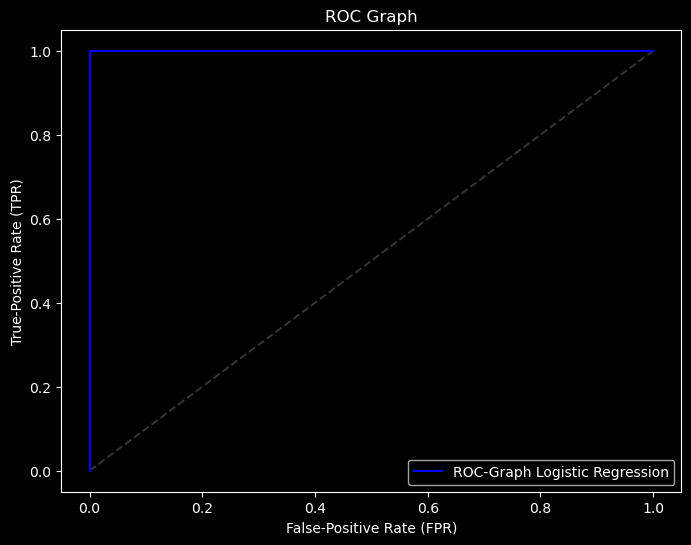

In [ ]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, logreg.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph Logistic Regression",c="blue")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### Support Vector Machine Classifier

In [ ]:
# Building a model: Support Vector Machine
svm = SVC()
svm.fit(x_train, y_train)

In [ ]:
print(type(x_train))
print(x_train.shape)

print(type(svm))
print(hasattr(svm, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_svm = shap.KernelExplainer(svm.predict, background_samples)
shap_values_svm = explainer_svm.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_dtc).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for logistic regression")
shap.summary_plot(shap_values_svm, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for support vector machine

predict_svm = svm.predict(x_test)

cm = confusion_matrix(predict_svm, y_test)
_, fp, fn, tp = cm.ravel()
print("accuracy of support vector machine: {}".format(accuracy_score(predict_svm, y_test)))
print("precision of support vectir machine: {}".format(tp/(tp + fp)))
print("recall of support vector machine: {}".format(tp/(tp + fn)))

In [ ]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, svm.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph Support Vector Machine",c="orange")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### Random Forest

In [ ]:
# Building a Model: Random Forest
random = RandomForestClassifier (criterion="entropy", max_depth=4, min_samples_split=50, random_state=1)
random.fit(x_train, y_train)

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(criterion='entropy', max_depth=4, min_samples_split=50,
                       random_state=1)

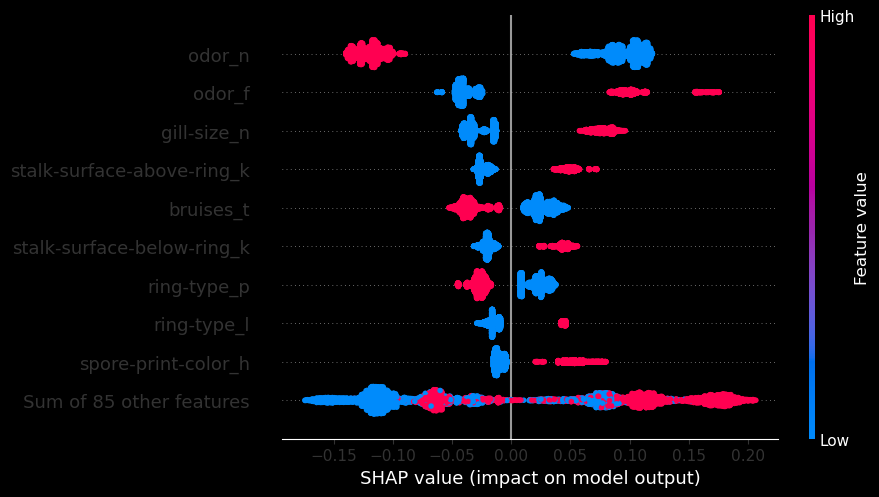

In [ ]:
# calculate feature importance with SHAP
explainer_short_random = Explainer(random)
sv_random = explainer_short_random(x_train)

beeswarm(sv_random[:,:,1])

<class 'pandas.core.frame.DataFrame'>
(5443, 94)
<class 'sklearn.ensemble._forest.RandomForestClassifier'>
True
<class 'pandas.core.frame.DataFrame'>
(1, 94)


  0%|          | 0/5443 [00:00<?, ?it/s]

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2300: RuntimeWarning: invalid value encountered in divide
  + residuals_sum_squares / self.noise_variance_
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_least_angle.py:2299: RuntimeWarning: divide by zero encountered in log
  n_samples * np.log(2 * np.pi * self.noise_variance_

Background samples shape: (1, 94)
SHAP values shape: (5443, 94)


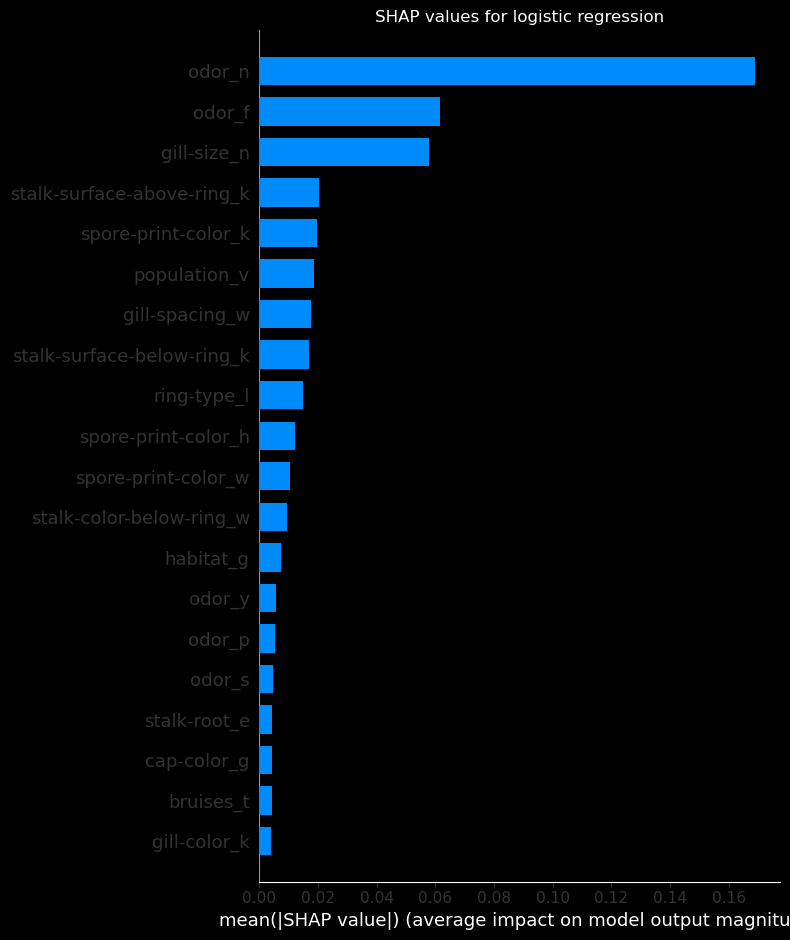

In [ ]:
# Analyzing SHAP-value
print(type(x_train))
print(x_train.shape)

print(type(random))
print(hasattr(random, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_random = shap.KernelExplainer(random.predict, background_samples)
shap_values_random = explainer_random.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_random).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for random forest")
shap.summary_plot(shap_values_random, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for random forest

predict_random = random.predict(x_test)

cm = confusion_matrix(predict_random, y_test)
_, fp, fn, tp = cm.ravel()

print("accuracy of random forest: {}".format(accuracy_score(predict_random, y_test)))
print("precision of random forest: {}".format(tp/(tp + fp)))
print("recall of random forest: {}".format(tp/(tp + fn)))

accuracy: 0.990302126072361
precision: 0.9799072642967542
recall: 1.0


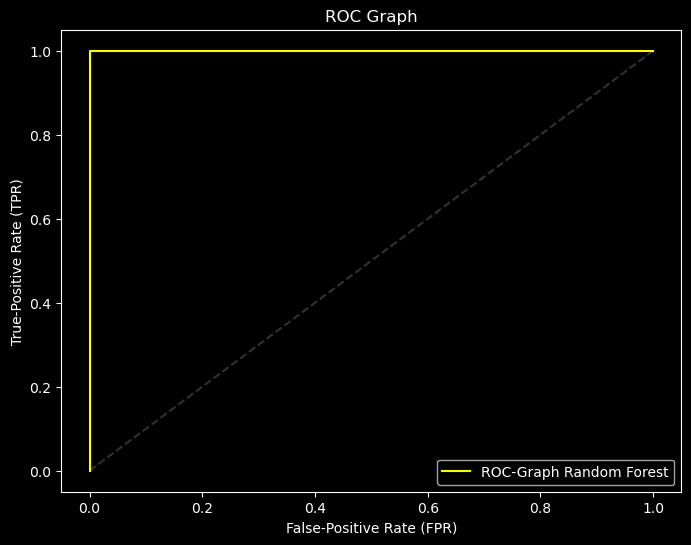

In [ ]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, random.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph Random Forest",c="yellow")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### XG Boosting 

In [ ]:
# Build a Model: XGBoost
bst = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1, objective='binary:logistic')
bst.fit(X_train, y_train)

In [ ]:
# Analyzing SHAP-value
print(type(x_train))
print(x_train.shape)

print(type(bst))
print(hasattr(bst, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_bst = shap.KernelExplainer(bst.predict, background_samples)
shap_values_bst = explainer_bst.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_bst).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for XG Boost")
shap.summary_plot(shap_values_bst, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for ensemble

predict_bst= bst.predict(x_test)

cm = confusion_matrix(predict_bst, y_test)
_, fp, fn, tp = cm.ravel()

print("accuracy of XG Boost: {}".format(accuracy_score(predict_bst, y_test)))
print("precision of XG Boost: {}".format(tp/(tp + fp)))
print("recall of XG Boost: {}".format(tp/(tp + fn)))

In [ ]:
# Graphing the ROC-Graph
plt.figure(figsize=(8,6))
plt.title("ROC Graph")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, bst.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph XG Boost",c="grey")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

### Bagging-Ensemble

In [ ]:
# Building a Model: Bagging-Ensemble
ensemble = VotingClassifier([("knn",KNeighborsClassifier()),("logreg",LogisticRegression()),("random",RandomForestClassifier(criterion="entropy", max_depth=5, min_samples_split=5, random_state=1))], voting='soft')
ensemble.fit(x_train,y_train)

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


VotingClassifier(estimators=[('dtc', DecisionTreeClassifier()),
                             ('logreg', LogisticRegression()),
                             ('random',
                              RandomForestClassifier(criterion='entropy',
                                                     max_depth=5,
                                                     min_samples_split=5,
                                                     random_state=1))],
                 voting='soft')

<class 'pandas.core.frame.DataFrame'>
(5443, 94)
<class 'sklearn.ensemble._voting.VotingClassifier'>
True
<class 'pandas.core.frame.DataFrame'>
(1, 94)


/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


  0%|          | 0/5443 [00:00<?, ?it/s]

/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/Users/Pudzich/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/Users/Pudzic

Background samples shape: (1, 94)
SHAP values shape: (5443, 94)


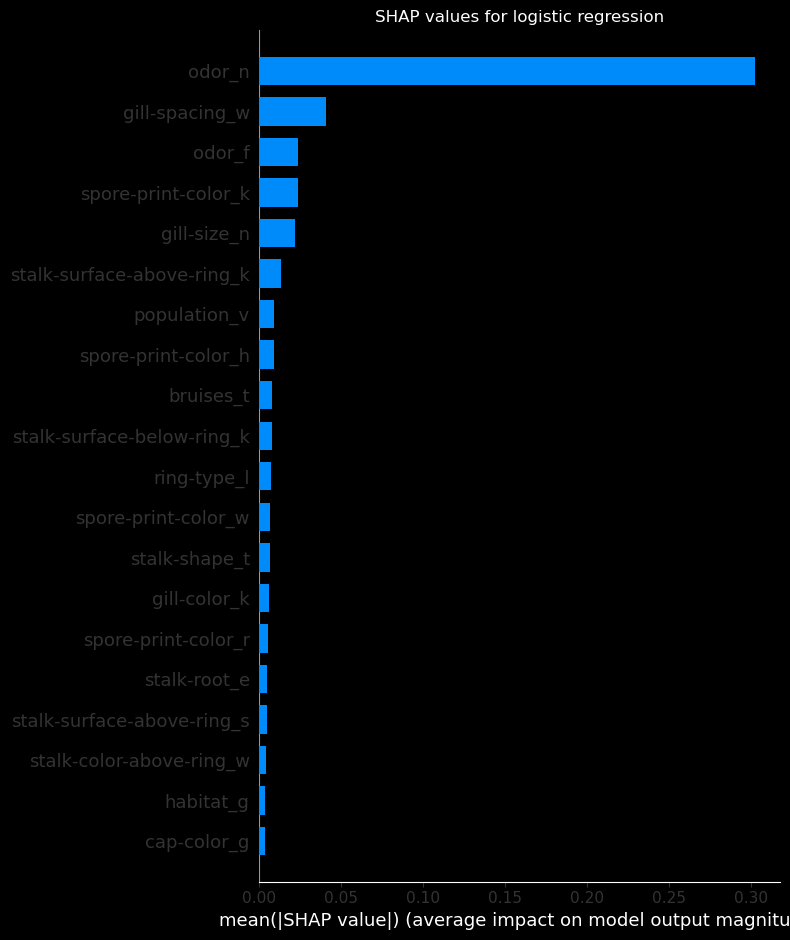

In [ ]:
# Analyzing SHAP-value
print(type(x_train))
print(x_train.shape)

print(type(ensemble))
print(hasattr(ensemble, 'predict'))

# Summarize background data using shap.sample
background_samples = shap.sample(x_train, 1)
print(type(background_samples))
print(background_samples.shape)

# SHAP Interpretation
explainer_ensemble = shap.KernelExplainer(ensemble.predict, background_samples)
shap_values_ensemble = explainer_ensemble.shap_values(x_train)

# Ensure the shapes are as expected
print(f"Background samples shape: {background_samples.shape}")
print(f"SHAP values shape: {np.array(shap_values_ensemble).shape}")

plt.figure(figsize=(8, 8))
plt.title("SHAP values for ensemble")
shap.summary_plot(shap_values_ensemble, x_train, plot_type="bar")
plt.show()

In [ ]:
# calculate accuracy, precision and recall for ensemble

predict_ensemble= ensemble.predict(x_test)

cm = confusion_matrix(predict_ensemble, y_test)
_, fp, fn, tp = cm.ravel()

print("accuracy of ensemble: {}".format(accuracy_score(predict_ensemble, y_test)))
print("precision of ensemble: {}".format(tp/(tp + fp)))
print("recall of ensemble: {}".format(tp/(tp + fn)))

accuracy: 1.0
precision: 1.0
recall: 1.0


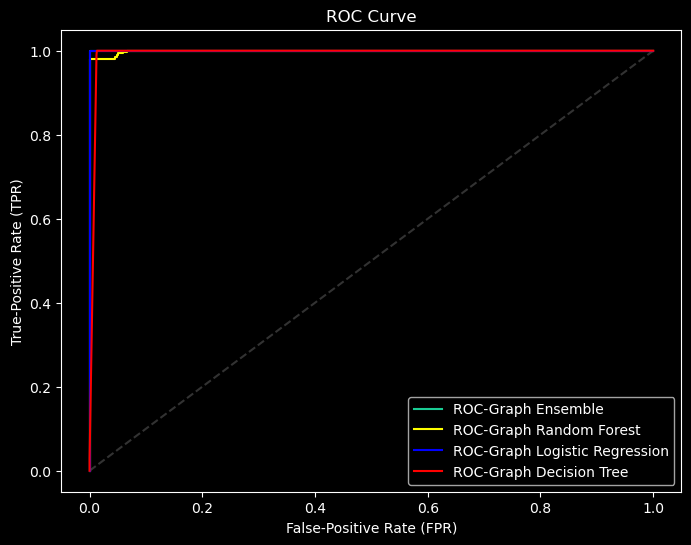

In [ ]:
# Graphing all ROC-Curves in one
plt.figure(figsize=(8,6))
plt.title("ROC Curve")
fpr, tpr, thresholds = metrics.roc_curve(y_test.values, ensemble.predict_proba(x_test)[:,1:])
fpr1, tpr1, thresholds1 = metrics.roc_curve(y_test.values, random.predict_proba(x_test)[:,1:])
fpr2, tpr2, thresholds2 = metrics.roc_curve(y_test.values, logreg.predict_proba(x_test)[:,1:])
fpr3, tpr3, thresholds3 = metrics.roc_curve(y_test.values, dtc.predict_proba(x_test)[:,1:])
fpr4, tpr4, thresholds4 = metrics.roc_curve(y_test.values, knn.predict_proba(x_test)[:,1:])
fpr5, tpr5, thresholds5 = metrics.roc_curve(y_test.values, svm.predict_proba(x_test)[:,1:])
fpr6, tpr6, thresholds6 = metrics.roc_curve(y_test.values, bst.predict_proba(x_test)[:,1:])
plt.plot([0,1],[0,1],ls="--",c="white",alpha=0.2)
plt.plot(fpr,tpr,label="ROC-Graph Ensemble",c="#1ACC94")
plt.plot(fpr1,tpr1,label="ROC-Graph Random Forest",c="yellow")
plt.plot(fpr2,tpr2,label="ROC-Graph Logistic Regression",c="blue")
plt.plot(fpr3,tpr3,label="ROC-Graph Decision Tree",c="red")
plt.plot(fpr4,tpr4,label="ROC-Graph kNN",c="purple")
plt.plot(fpr5,tpr5,label="ROC-Graph Support Vector Machine",c="orange")
plt.plot(fpr5,tpr5,label="XR Boost",c="grey")
plt.xlabel("False-Positive Rate (FPR)")
plt.ylabel("True-Positive Rate (TPR)")
plt.legend()
plt.show()

In [ ]:
# calculate AUROC scores
auroc_dtc = roc_auc_score(y_test, predict_dtc)
auroc_logreg = roc_auc_score(y_test, predict_logreg)
auroc_random = roc_auc_score(y_test, predict_random)
auroc_ensemble = roc_auc_score(y_test, predict_ensemble)
auroc_knn = roc_auc_score(y_test, predict_knn)
auroc_svm = roc_auc_score(y_test, predict_svm)

print("AUROC-Score for Decision Tree: {}".format(auroc_dtc))
print("AUROC-Score for Logistic Regression: {}".format(auroc_logreg))
print("AUROC-Score for Random Forest: {}".format(auroc_random))
print("AUROC-Score for Ensemble: {}".format(auroc_ensemble))
print("AUROC-Score for kNN: {}".format(auroc_knn))
print("AUROC-Score for Support Vector Machine: {}".format(auroc_svm))

AUROC-Score for Decision Tree: 0.9935111751982697
AUROC-Score for Logistic Regression: 1.0
AUROC-Score for Random Forest: 0.9899536321483771
AUROC-Score for Ensemble: 1.0
